In [1]:
import numpy as np
from skimage import io
from veg_index import Image_Multi
import matplotlib.pyplot as plt
from matplotlib import path
import matplotlib.patches as patches
import georasters as gr

from scipy import misc
import math
import scipy.ndimage.filters as filters
import scipy.ndimage as ndimage
import Utils
import cv2

/home/dlsaavedra/anaconda3/envs/new/lib/python3.7/site-packages/pysal/__init__.py:65: VisibleDeprecationWarning: PySAL's API will be changed on 2018-12-31. The last release made with this API is version 1.14.4. A preview of the next API version is provided in the `pysal` 2.0 prelease candidate. The API changes and a guide on how to change imports is provided at https://migrating.pysal.org
  ), VisibleDeprecationWarning)


# Load Image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[(505, 7), (7, 1407), (3707, 3106), (4382, 1461)]


<Figure size 432x288 with 0 Axes>

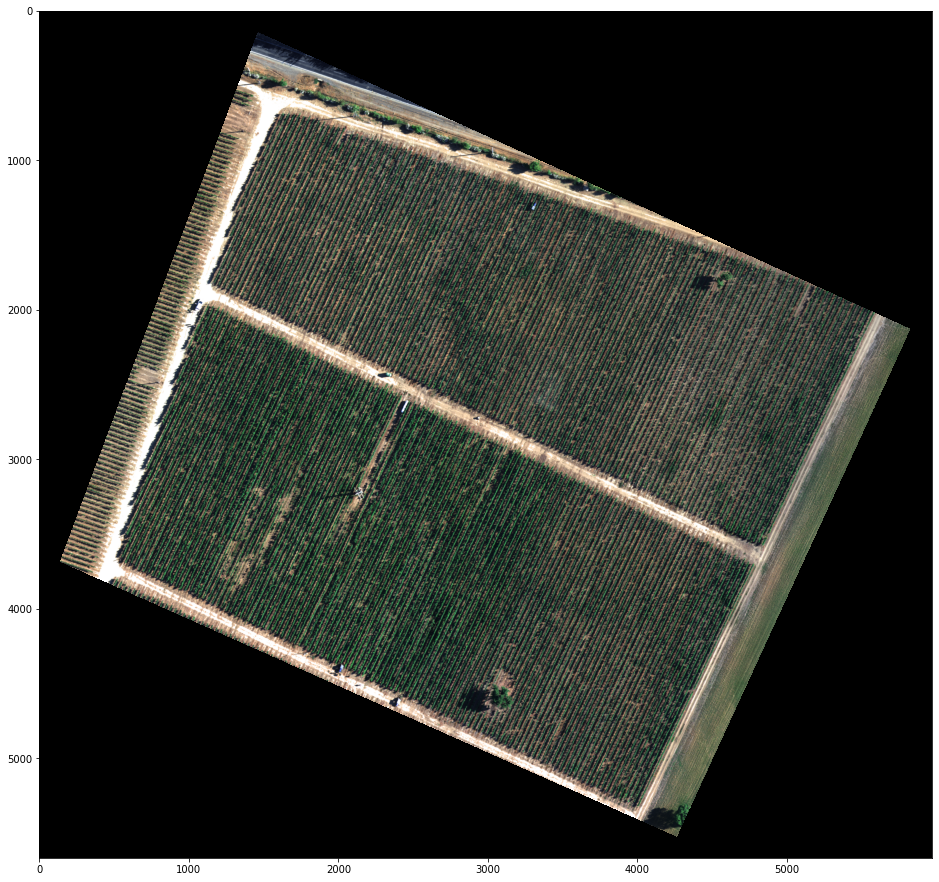

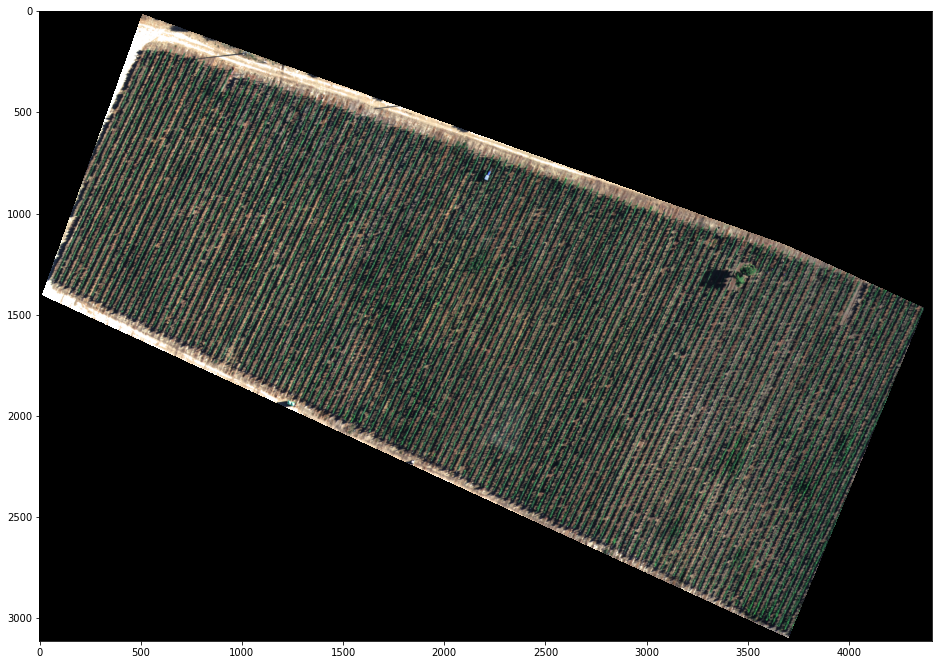

In [2]:
im_red_path = "Barrack A/result_Red.tif"
im_green_path = "Barrack A//result_Green.tif"
im_blue_path = "Barrack A/result_Blue.tif"
im_nir_path = "Barrack A/result_NIR.tif"
im_rededge_path = "Barrack A/result_RedEdge.tif"

im_multi = Image_Multi(im_red_path, im_green_path, im_blue_path, im_nir_path, im_rededge_path)

List_P = [(1600, 500),(4800, 3600), (1100, 1900), (5500, 1900)]
#List_P = [(500, 3700), (1000, 1900), (4900, 3600), (4000, 5500)]

im_multi_seg = im_multi.Segmentation(List_P)

Points = np.array(im_multi_seg.list_P)
Points_order = Utils.order_points_rect(Points)

M, maxWidth, maxHeight = Utils.perspectiveTransform(Points)

plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi.RGB().raster)

plt.figure(1)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)
print(im_multi_seg.list_P)


# Divide Image and rotate subimage

45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


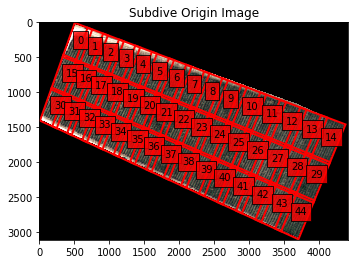

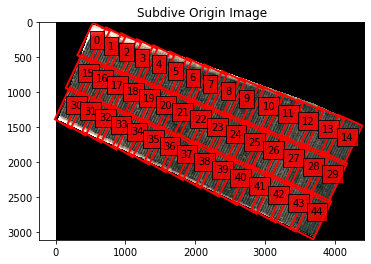

In [3]:
# top-left, top-right, bottom-right, and bottom-left
split_Weight, split_Height = 15, 3
sub_division = Utils.subdivision_rect([split_Weight, split_Height], maxWidth, maxHeight, 0.01)

sub_division_origin = cv2.perspectiveTransform(np.array(sub_division), np.linalg.inv(M))
print(len(sub_division))

List_P = np.uint(sub_division_origin)
List_new_P = []

for P in List_P:
    #P = List_P[3]
    im = im_multi_seg.Segmentation(P) 
    NDVI = im.NDVI().raster

    #NDVI = 2. * (NDVI - np.nanmin(NDVI)) / (np.nanmax(NDVI) - np.nanmin(NDVI))- 1
    #blur[np.isnan(blur)] = 0
    Points = np.array(im.list_P)

    M, maxWidth, maxHeight = Utils.perspectiveTransform(Utils.order_points_rect(Points))

    warped = cv2.warpPerspective(NDVI, M, (maxWidth, maxHeight))
    warped[np.isnan(warped)] = 0

    # Otsu
    blur = cv2.GaussianBlur(warped * 255,(5,5),0).astype('uint8')
    ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    n_important = 100
    skel_filter = Utils.skeleton(th3, n_important = 100)

    theta_prop = Utils.angle_lines(skel_filter,  n_important = 100, angle_resolution = 720,
                                   threshold = 100, min_line_length = 200,
                                   max_line_gap = 50, plot = False)


    #center = (im.list_P[0][0], im.list_P[0][1])
    #center_pol = center
    center = (np.mean([point[0] for point in P]), np.mean([point[1] for point in P]))
    matrix = cv2.getRotationMatrix2D(center=center, angle= -theta_prop*180/np.pi, scale=1)
    
    
    
    new_P = cv2.transform(np.array([P]), matrix)[0]

    #im_multi_seg_new = im_multi_seg.Segmentation(new_P)

    #new_Points = np.array(im_multi_seg_new.list_P)
    List_new_P.append(new_P)
    #print(theta_prop)
    
plt.figure(0)
plt.imshow(im_multi_seg.RGB().raster.copy())
plt.title('Subdive Origin Image')
ax = plt.gca()

for i,Poly in enumerate(List_P):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     fill = False)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)
    
    
plt.figure(1)
plt.imshow(im_multi_seg.RGB().raster.copy())
plt.title('Subdive Origin Image')
ax = plt.gca()

ax.scatter(center[0], center[1], marker='o', color='g', label='point')
for i,Poly in enumerate(List_new_P):
    
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     fill = False)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

/home/dlsaavedra/anaconda3/envs/new/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in greater
/home/dlsaavedra/anaconda3/envs/new/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in greater
/home/dlsaavedra/anaconda3/envs/new/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in greater


Text(0.5, 1.0, 'NDVI > 0.6')

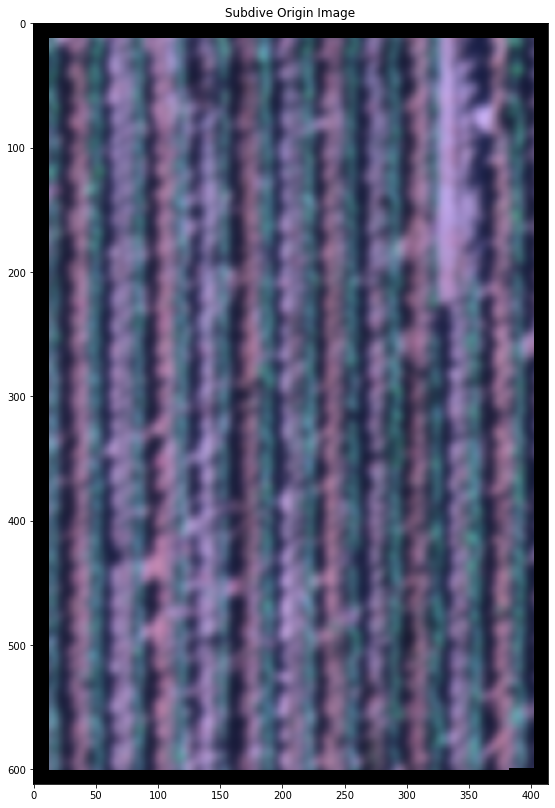

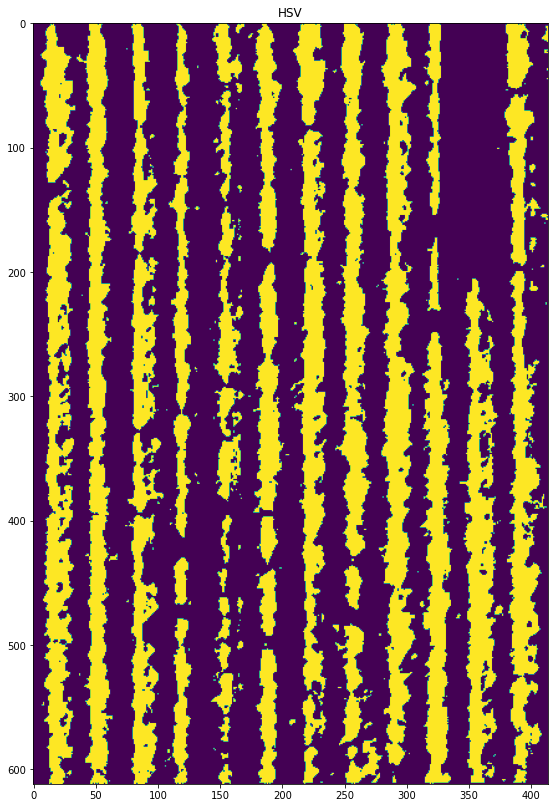

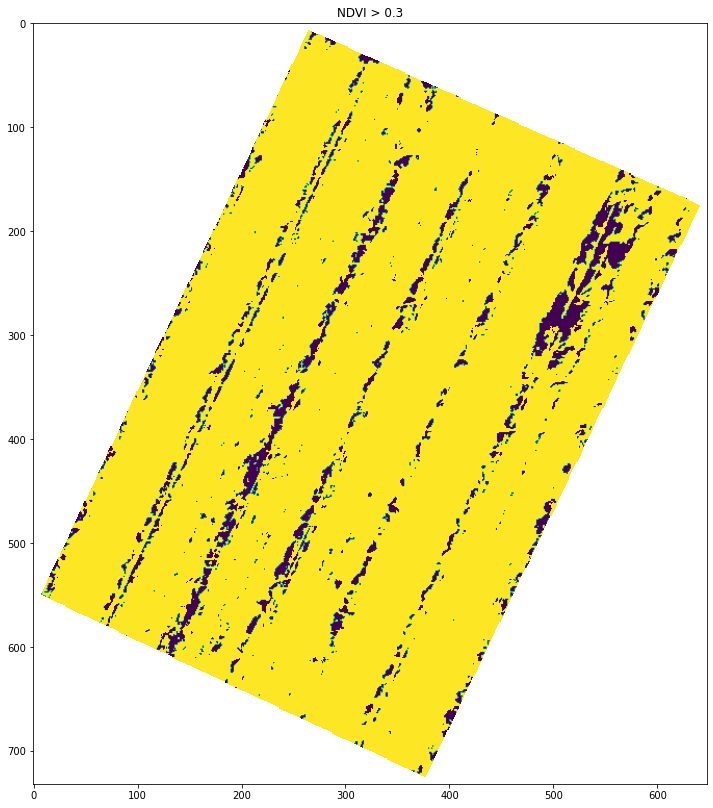

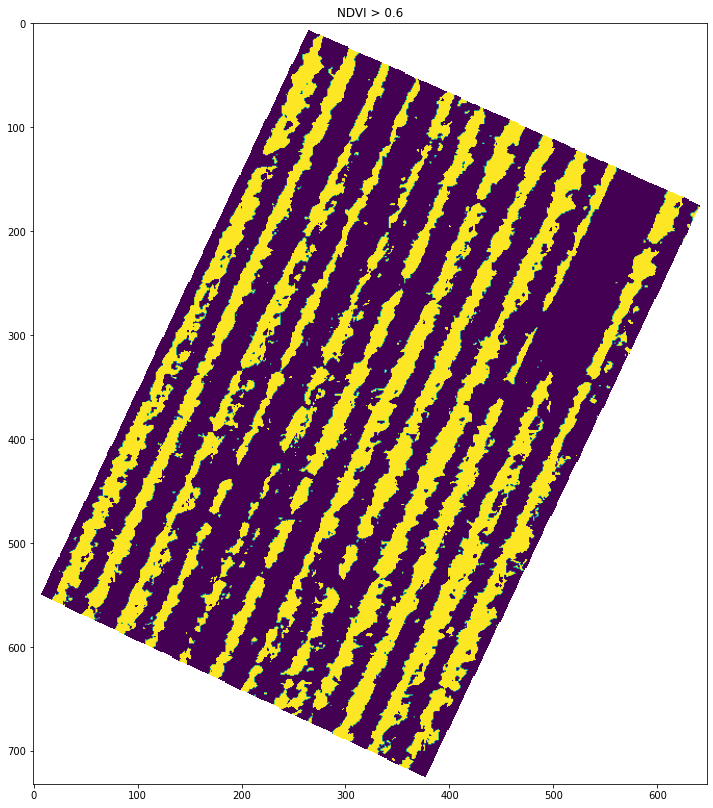

In [13]:
P = List_new_P[13]
P = Utils.order_points_rect(P)
im = im_multi_seg.Segmentation(P)

Points = np.array(im.list_P)
M_sub, maxWidth, maxHeight = Utils.perspectiveTransform(Utils.order_points_rect(Points))
RGB = cv2.warpPerspective(im.RGB().raster, M_sub, (maxWidth, maxHeight))

RGB = cv2.GaussianBlur(RGB,(21,21),0).astype('float32')
HSV = Utils.rgb2hsv(RGB)

H = HSV[:, :, 0]
H2 = H.copy()
#H2 = cv2.GaussianBlur(H2,(9,9),0).astype('float32')
H2[H > 210] = 0
H2[H < 210] = 1
H2[H < 70] = 0
H2 = H2.astype('uint8')

### Change Green color to NDVI 
NDVI = cv2.warpPerspective(im.NDVI().raster, M_sub, (maxWidth, maxHeight))
H2 = (NDVI > 0.6).astype('uint8')


plt.figure(0, figsize = (14,14))
plt.imshow(RGB)
plt.title('Subdive Origin Image')


plt.figure(1, figsize = (14,14))
plt.imshow(H2)
plt.title('HSV')


plt.figure(3, figsize = (14,14))
plt.imshow(im.NDVI().raster > 0.3)
plt.title('NDVI > 0.3')

plt.figure(4, figsize = (14,14))
plt.imshow(im.NDVI().raster > 0.6)
plt.title('NDVI > 0.6')

Text(0.5, 1.0, 'L')

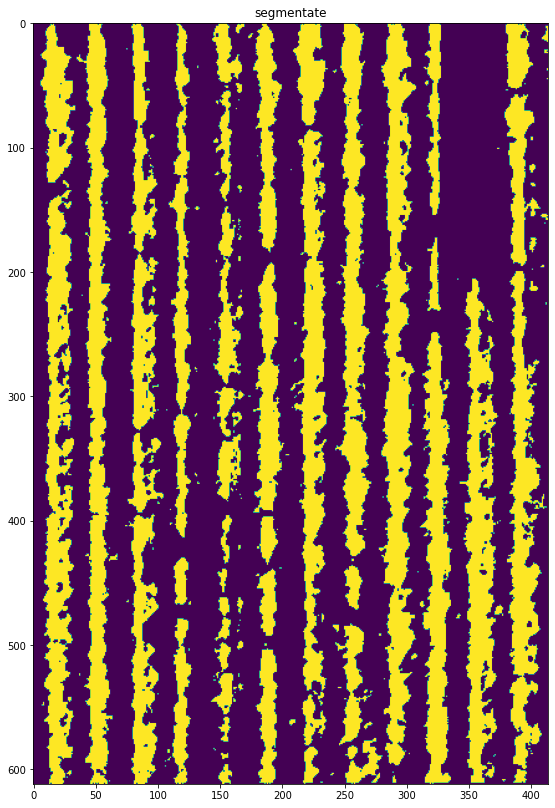

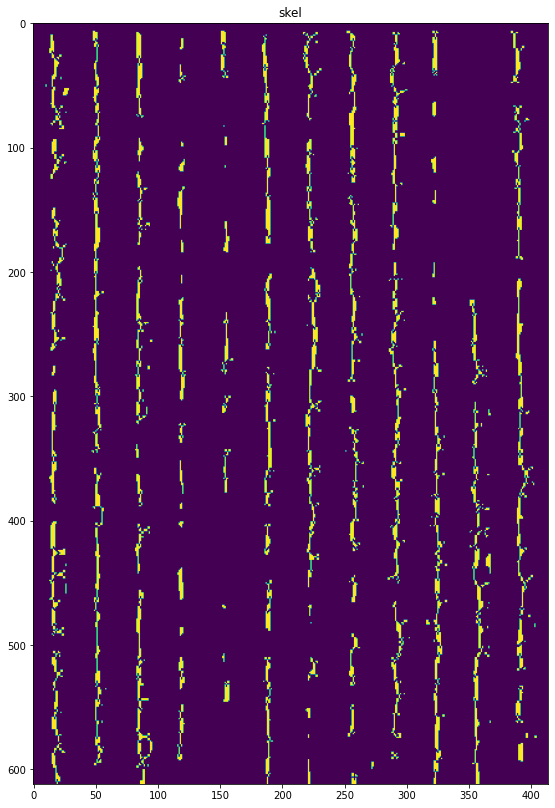

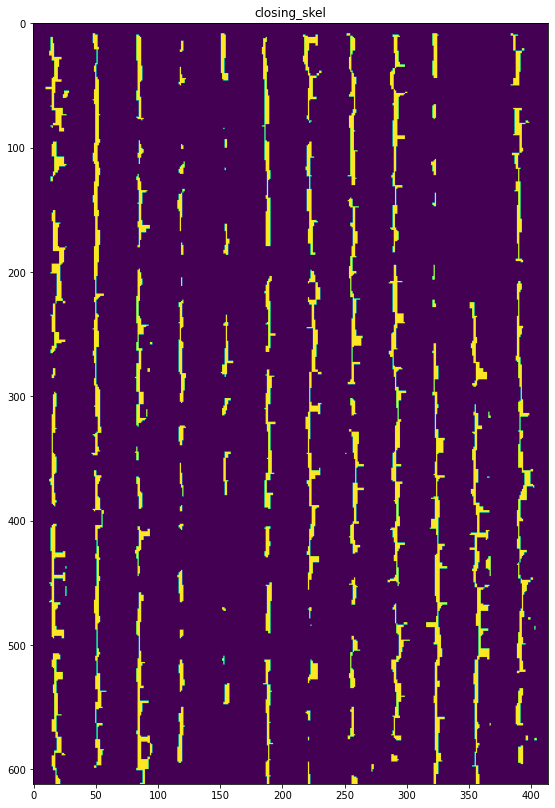

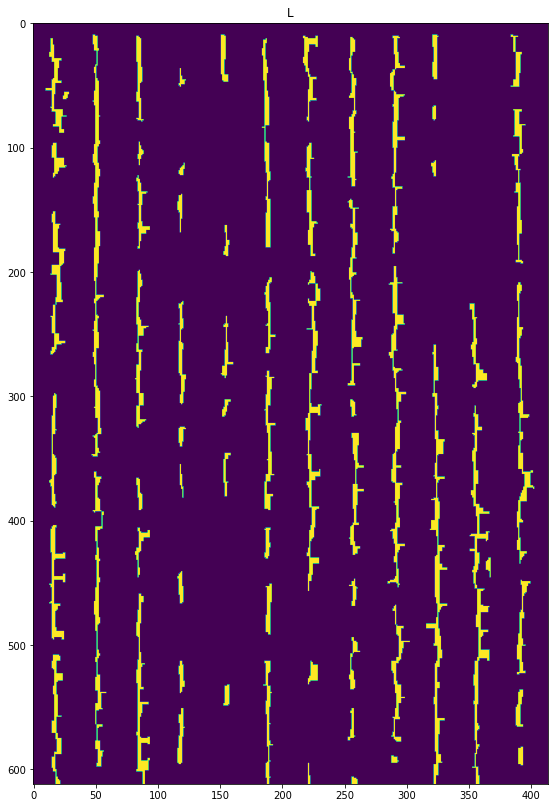

In [14]:
### Create kernel rotate #########333
size_kernel = 10
kernel = np.ones((size_kernel, 5) , np.uint8)  # note this is a vertical kernel
#kernel = np.ones((5, 5) , np.uint8)

erode = cv2.erode(H2,kernel)
closing = cv2.morphologyEx(erode, cv2.MORPH_CLOSE, kernel)
skel = Utils.skeleton(closing, n_important = -1)


closing_skel = cv2.morphologyEx(skel.astype(float), cv2.MORPH_CLOSE, kernel)
closing_skel = cv2.morphologyEx(closing_skel, cv2.MORPH_CLOSE, kernel)

label_im, nb_labels = ndimage.label(closing_skel)#, structure= np.ones((2,2))) ## Label each connect region
label_areas = np.bincount(label_im.ravel())[1:]

th = 20 #np.mean(label_areas) # Th

L = np.zeros(label_im.shape)

for i in range(nb_labels):
    if label_areas[i] > th:
        L[label_im == (i + 1) ] = 1

L = cv2.morphologyEx(L, cv2.MORPH_CLOSE, kernel)
   
plt.figure(0, figsize = (14,14))
plt.imshow(H2)
plt.title('segmentate')

plt.figure(1, figsize = (14,14))
plt.imshow(closing)
plt.title('closing')

plt.figure(1, figsize = (14,14))
plt.imshow(skel)
plt.title('skel')

plt.figure(2, figsize = (14,14))
plt.imshow(closing_skel)
plt.title('closing_skel')

plt.figure(3, figsize = (14,14))
plt.imshow(L)
plt.title('L')







Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


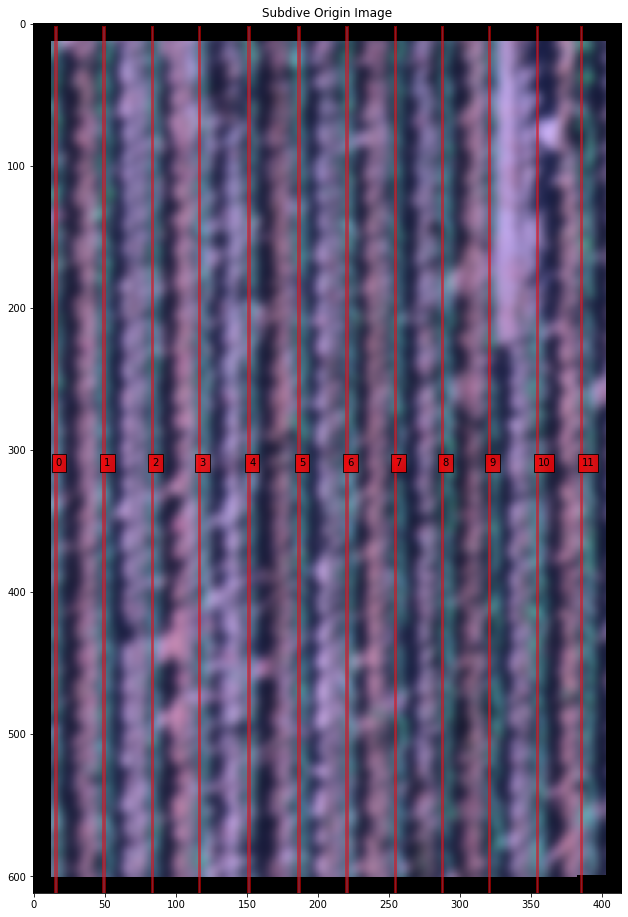

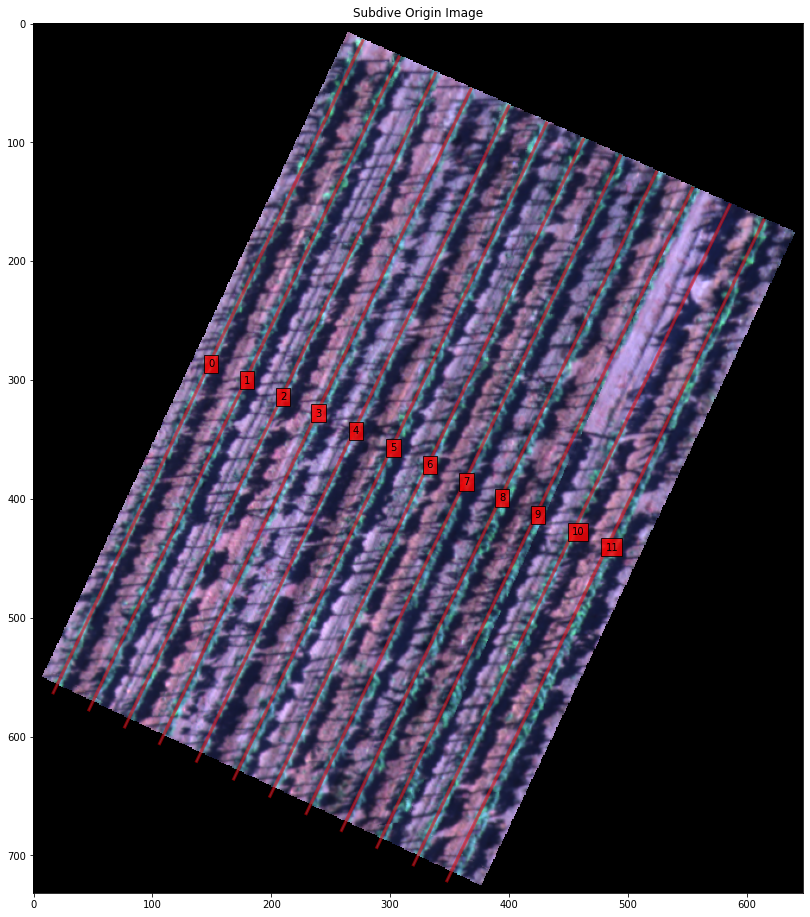

<Figure size 432x288 with 0 Axes>

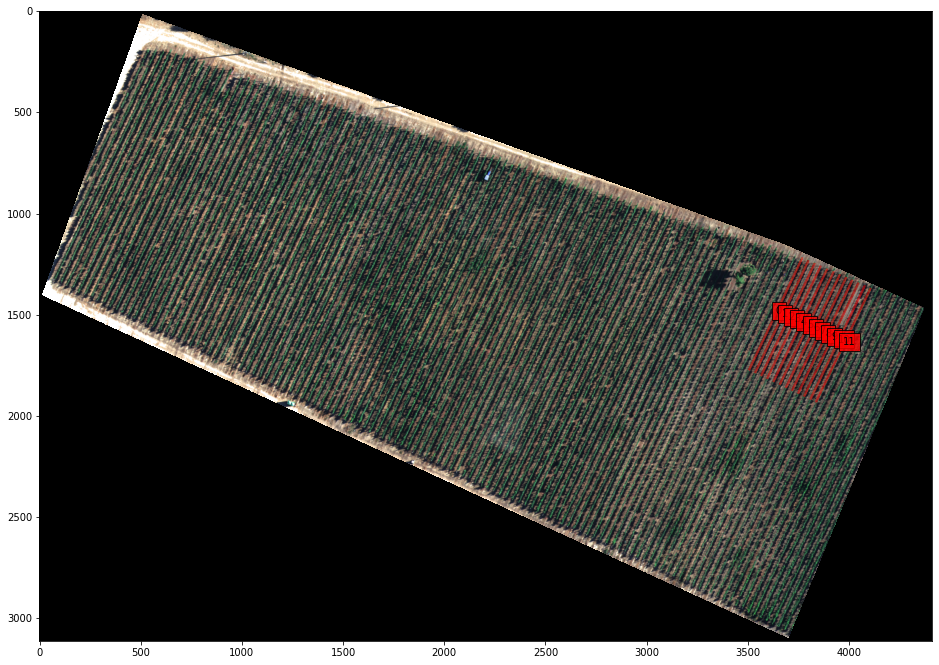

In [15]:
label_im, nb_labels = ndimage.label(L)#, structure= np.ones((2,2))) ## Label each connect region
label_areas = np.bincount(label_im.ravel())[1:]

List_Centroid_WH = []
for i in range(nb_labels):
    
    I = np.zeros(label_im.shape)
    I[label_im == (i + 1)] = 1
    # calculate moments of binary image
    Moments = cv2.moments(I)
    # calculate x,y coordinate of center
    cX = int(Moments["m10"] / Moments["m00"])
    cY = int(Moments["m01"] / Moments["m00"])
    cnts, hierarchy = cv2.findContours(I.astype('uint8'), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    width = np.max([x[0][0] for x in cnts[0]]) - np.min([x[0][0] for x in cnts[0]])
    height = np.max([y[0][1] for y in cnts[0]]) - np.min([y[0][1] for y in cnts[0]])
    List_Centroid_WH.append((cX, cY, width, height))

x_min = np.min([x[0] - x[2]/2 for x in List_Centroid_WH])
x_max = np.max([x[0] + x[2]/2 for x in List_Centroid_WH])
y_min = np.min([y[1] - y[3]/2 for y in List_Centroid_WH])
y_max = np.max([y[1] + y[3]/2 for y in List_Centroid_WH])

L_xw = sorted([[x[0],x[2]] for x in List_Centroid_WH])

## Filter width separation
th = np.mean(L_xw, axis=0)[1]
L_filter = [L_xw[0][0]]
L_width = [L_xw[0][1]]
for i in range(len(L_xw)):
    if (abs(L_filter[-1] - L_xw[i][0]) > th):
        L_filter.append(L_xw[i][0])
        L_width.append(L_xw[i][1])

#filter mean dif separation
dif = [L_filter[i] - L_filter[i-1] for i in range(1, len(L_filter))]
th = np.mean(dif).astype('int') + np.std(dif).astype('int') - 10
L_filter_2 = [L_filter[0]]
L_width_2 = [L_width[0]]
for i in range(len(L_filter)):
    if (abs(L_filter_2[-1] - L_filter[i]) > th):
        L_filter_2.append(L_filter[i])
        L_width_2.append(L_width[i])

####################### lista de poligonos ################
List_lines = [] #(top-left, top-right,bottom-right, bottom-left
avg_width = 1 #np.mean(L_width_2)/3#L_width[i]
for i in range(len(L_filter_2)):
    
    
    top_left = (int(L_filter_2[i] - avg_width/2) , y_min)
    top_right = (int(L_filter_2[i] + avg_width/2) , y_min)
    bottom_right = (int(L_filter_2[i] + avg_width/2) , y_max)
    bottom_left = (int(L_filter_2[i] - avg_width/2) , y_max)
    if  int(L_filter_2[i] - avg_width/2) > L.shape[1]:
        print('Salio')
        break
    
    List_lines.append((top_left, top_right, bottom_right, bottom_left))

List_lines_origin = cv2.perspectiveTransform(np.array(List_lines), np.linalg.inv(M_sub)) # In subdivide image
List_lines_origin_complete = List_lines_origin - Utils.order_points_rect(Points)[0] + Utils.order_points_rect(P)[0] # In image complet # Put line in big image

plt.figure(0, figsize = (16,16))
plt.imshow(RGB)
plt.title('Subdive Origin Image')
ax = plt.gca()

for i,Poly in enumerate(List_lines):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)
 
plt.figure(1, figsize = (16,16))
plt.imshow(im.RGB().raster)
plt.title('Subdive Origin Image')
ax = plt.gca()

for i,Poly in enumerate(List_lines_origin):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)
    
plt.figure(2)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()


for i,Poly in enumerate(List_lines_origin_complete):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)
    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


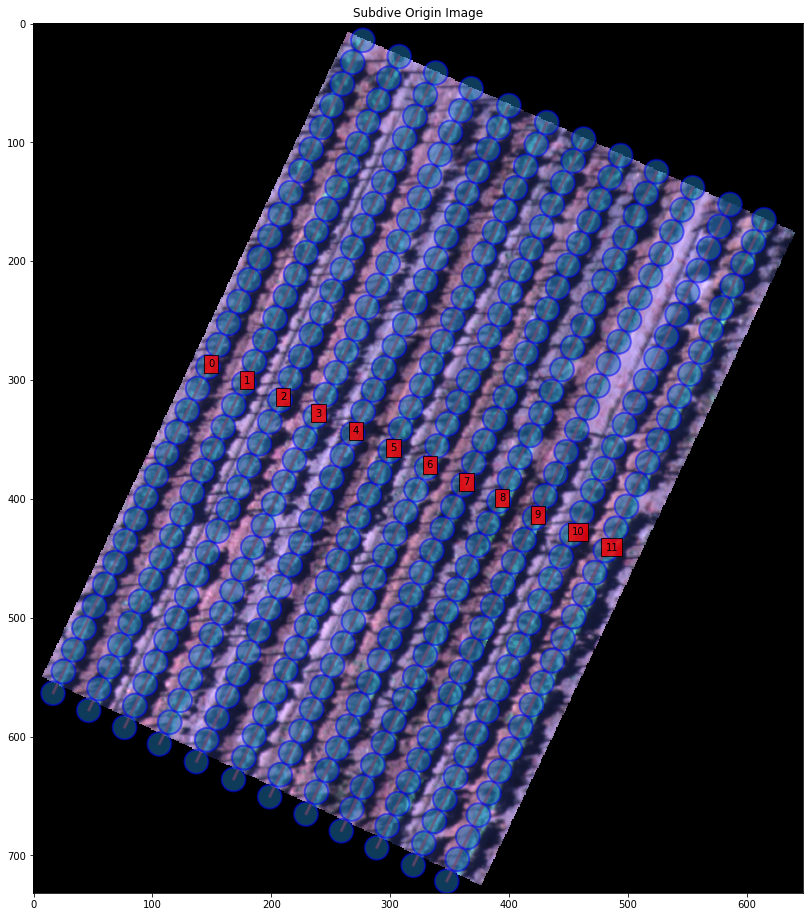

In [16]:
plt.figure(0, figsize = (16,16))
plt.imshow(im.RGB().raster)
plt.title('Subdive Origin Image')
ax = plt.gca()

r_circle = 10
for i,Poly in enumerate(List_lines_origin):
    poly = patches.Polygon(Poly,
                         linewidth=2,
                         edgecolor='red',
                         alpha=0.5,
                         fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

    P1 = np.mean(Poly[0:2], axis=0)
    P2 = np.mean(Poly[2:4], axis=0)
   
    distance = np.linalg.norm(P1-P2)
    n_step = int(distance/(r_circle *2))
    centers = np.array([P1 * t/n_step + P2 * (n_step-t)/n_step for t in range(n_step + 1)])

    for x1, y1 in centers: 
        circle = patches.Circle((x1, y1), r_circle, 
                                linewidth=2,
                                 edgecolor='blue',
                                 alpha=0.5,
                                 fill = True) 
        ax.add_patch(circle)

# All lines GREEN

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

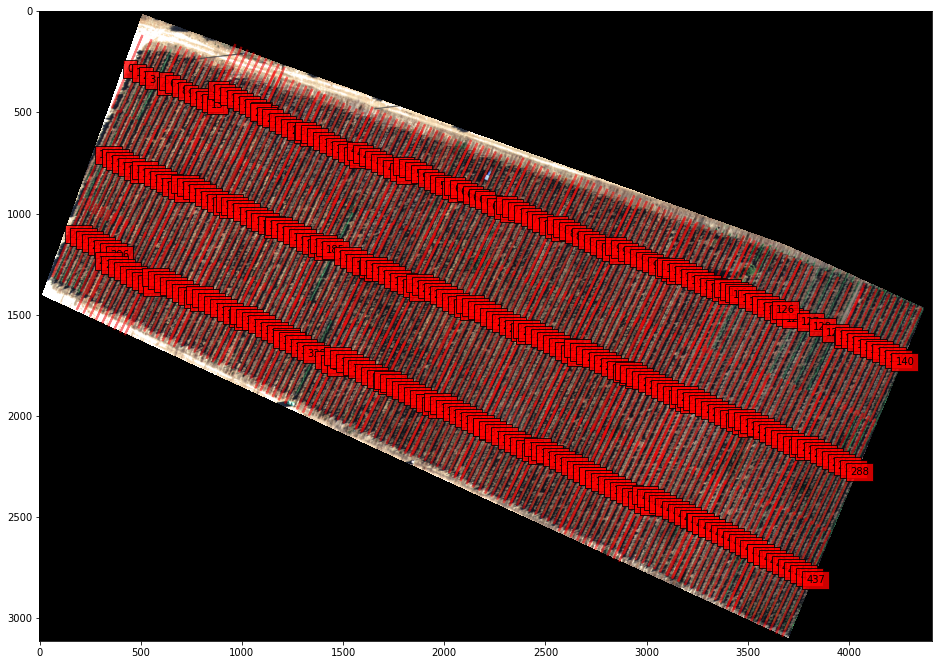

In [8]:
List_lines_origin_complete =  np.ones((0,4,2))

gaussian_kernel_size = 21
th_green_up = 210
th_green_down = 70
vertical_kernel_size_h = 10
vertical_kernel_size_w = 5
th_small_areas = 30
lines_width = 1
merge_bt_line = 10

for P in List_new_P:

    P = Utils.order_points_rect(P)
    im = im_multi_seg.Segmentation(P)

    Points = np.array(im.list_P)
    M_sub, maxWidth, maxHeight = Utils.perspectiveTransform(Utils.order_points_rect(Points))
    RGB = cv2.warpPerspective(im.RGB().raster, M_sub, (maxWidth, maxHeight))

    RGB = cv2.GaussianBlur(RGB,(gaussian_kernel_size, gaussian_kernel_size),0).astype('float32')
    HSV = Utils.rgb2hsv(RGB)

    H = HSV[:, :, 0]
    H2 = H.copy()
    #H2 = cv2.GaussianBlur(H2,(9,9),0).astype('float32')
    H2[H > th_green_up] = 0
    H2[H < th_green_up] = 1
    H2[H < th_green_down] = 0
    H2 = H2.astype('uint8')

    ### Create kernel rotate #########333

    kernel = np.ones((vertical_kernel_size_h, vertical_kernel_size_w) , np.uint8)  # note this is a vertical kernel
    #kernel = np.ones((5, 5) , np.uint8)

    erode = cv2.erode(H2,kernel)
    closing = cv2.morphologyEx(erode, cv2.MORPH_CLOSE, kernel)
    skel = Utils.skeleton(closing, n_important = -1)


    closing_skel = cv2.morphologyEx(skel.astype(float), cv2.MORPH_CLOSE, kernel)
    closing_skel = cv2.morphologyEx(closing_skel, cv2.MORPH_CLOSE, kernel)

    label_im, nb_labels = ndimage.label(closing_skel)#, structure= np.ones((2,2))) ## Label each connect region
    label_areas = np.bincount(label_im.ravel())[1:]


    L = np.zeros(label_im.shape)

    for i in range(nb_labels):
        if label_areas[i] > th_small_areas:
            L[label_im == (i + 1) ] = 1

    L = cv2.morphologyEx(L, cv2.MORPH_CLOSE, kernel)
    
    label_im, nb_labels = ndimage.label(L)#, structure= np.ones((2,2))) ## Label each connect region
    label_areas = np.bincount(label_im.ravel())[1:]

    List_Centroid_WH = []
    for i in range(nb_labels):

        I = np.zeros(label_im.shape)
        I[label_im == (i + 1)] = 1
        # calculate moments of binary image
        Moments = cv2.moments(I)
        # calculate x,y coordinate of center
        cX = int(Moments["m10"] / Moments["m00"])
        cY = int(Moments["m01"] / Moments["m00"])
        cnts, hierarchy = cv2.findContours(I.astype('uint8'), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        width = np.max([x[0][0] for x in cnts[0]]) - np.min([x[0][0] for x in cnts[0]])
        height = np.max([y[0][1] for y in cnts[0]]) - np.min([y[0][1] for y in cnts[0]])
        List_Centroid_WH.append((cX, cY, width, height))

    x_min = np.min([x[0] - x[2]/2 for x in List_Centroid_WH])
    x_max = np.max([x[0] + x[2]/2 for x in List_Centroid_WH])
    y_min = np.min([y[1] - y[3]/2 for y in List_Centroid_WH])
    y_max = np.max([y[1] + y[3]/2 for y in List_Centroid_WH])

    L_xw = sorted([[x[0],x[2]] for x in List_Centroid_WH])

    ## Filter width separation
    th = np.mean(L_xw, axis=0)[1]
    L_filter = [L_xw[0][0]]
    L_width = [L_xw[0][1]]
    for i in range(len(L_xw)):
        if (abs(L_filter[-1] - L_xw[i][0]) > th):
            L_filter.append(L_xw[i][0])
            L_width.append(L_xw[i][1])

    #filter mean dif separation
    dif = [L_filter[i] - L_filter[i-1] for i in range(1, len(L_filter))]
    th = np.mean(dif).astype('int') + np.std(dif).astype('int') - merge_bt_line
    L_filter_2 = [L_filter[0]]
    L_width_2 = [L_width[0]]
    for i in range(len(L_filter)):
        if (abs(L_filter_2[-1] - L_filter[i]) > th):
            L_filter_2.append(L_filter[i])
            L_width_2.append(L_width[i])

    ####################### lista de poligonos ################
    List_lines = [] #(top-left, top-right,bottom-right, bottom-left
    avg_width = lines_width #np.mean(L_width_2)/3#L_width[i]
    for i in range(len(L_filter_2)):


        top_left = (int(L_filter_2[i] - avg_width/2) , y_min)
        top_right = (int(L_filter_2[i] + avg_width/2) , y_min)
        bottom_right = (int(L_filter_2[i] + avg_width/2) , y_max)
        bottom_left = (int(L_filter_2[i] - avg_width/2) , y_max)
        if  int(L_filter_2[i] - avg_width/2) > L.shape[1]:
            break

        List_lines.append((top_left, top_right, bottom_right, bottom_left))

    List_lines_origin = cv2.perspectiveTransform(np.array(List_lines), np.linalg.inv(M_sub)) # In subdivide image
    List_lines_origin_complete = np.concatenate((List_lines_origin_complete, 
                                                    List_lines_origin - Utils.order_points_rect(Points)[0] + Utils.order_points_rect(P)[0]))# In image complet # Put line in big image

    
plt.figure(2)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()


for i,Poly in enumerate(List_lines_origin_complete):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

# All Image NDVI

/home/dlsaavedra/anaconda3/envs/new/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

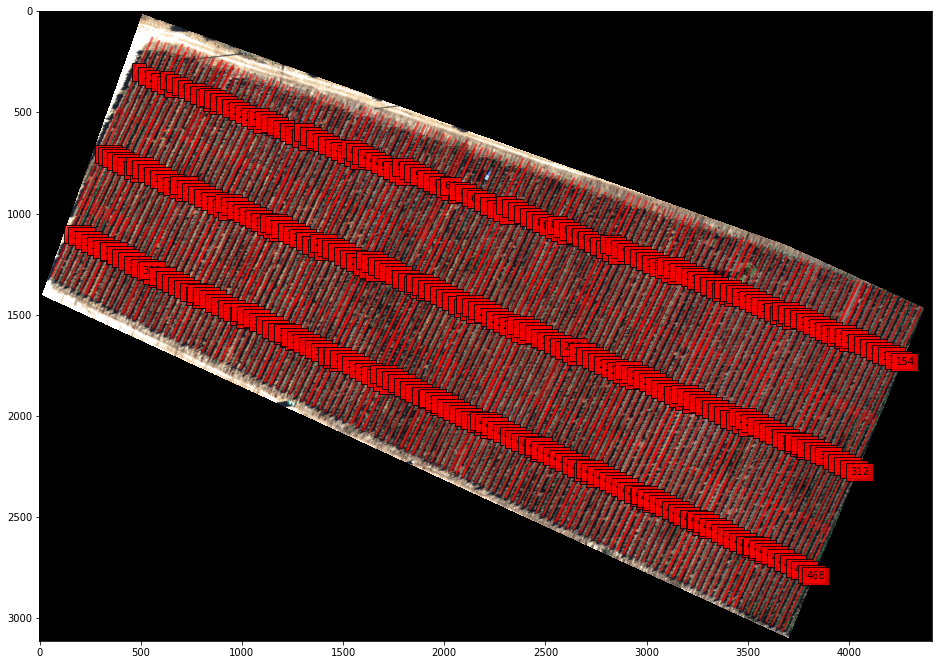

In [24]:
List_lines_origin_complete =  np.ones((0, 4, 2))

th_NDVI = 0.6
vertical_kernel_size_h = 10
vertical_kernel_size_w = 5
th_small_areas = 30
lines_width = 1
merge_bt_line = 10

for P in List_new_P:

    P = Utils.order_points_rect(P)
    im = im_multi_seg.Segmentation(P)

    Points = np.array(im.list_P)
    M_sub, maxWidth, maxHeight = Utils.perspectiveTransform(Utils.order_points_rect(Points))
    
    NDVI = cv2.warpPerspective(im.NDVI().raster, M_sub, (maxWidth, maxHeight))
    H2 = (NDVI > th_NDVI).astype('uint8')
    ### Create kernel rotate #########333

    kernel = np.ones((vertical_kernel_size_h, vertical_kernel_size_w) , np.uint8)  # note this is a vertical kernel
    #kernel = np.ones((5, 5) , np.uint8)

    erode = cv2.erode(H2,kernel)
    closing = cv2.morphologyEx(erode, cv2.MORPH_CLOSE, kernel)
    skel = Utils.skeleton(closing, n_important = -1)


    closing_skel = cv2.morphologyEx(skel.astype(float), cv2.MORPH_CLOSE, kernel)
    closing_skel = cv2.morphologyEx(closing_skel, cv2.MORPH_CLOSE, kernel)

    label_im, nb_labels = ndimage.label(closing_skel)#, structure= np.ones((2,2))) ## Label each connect region
    label_areas = np.bincount(label_im.ravel())[1:]


    L = np.zeros(label_im.shape)

    for i in range(nb_labels):
        if label_areas[i] > th_small_areas:
            L[label_im == (i + 1) ] = 1

    L = cv2.morphologyEx(L, cv2.MORPH_CLOSE, kernel)
    
    label_im, nb_labels = ndimage.label(L)#, structure= np.ones((2,2))) ## Label each connect region
    label_areas = np.bincount(label_im.ravel())[1:]

    List_Centroid_WH = []
    for i in range(nb_labels):

        I = np.zeros(label_im.shape)
        I[label_im == (i + 1)] = 1
        # calculate moments of binary image
        Moments = cv2.moments(I)
        # calculate x,y coordinate of center
        cX = int(Moments["m10"] / Moments["m00"])
        cY = int(Moments["m01"] / Moments["m00"])
        cnts, hierarchy = cv2.findContours(I.astype('uint8'), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        width = np.max([x[0][0] for x in cnts[0]]) - np.min([x[0][0] for x in cnts[0]])
        height = np.max([y[0][1] for y in cnts[0]]) - np.min([y[0][1] for y in cnts[0]])
        List_Centroid_WH.append((cX, cY, width, height))

    x_min = np.min([x[0] - x[2]/2 for x in List_Centroid_WH])
    x_max = np.max([x[0] + x[2]/2 for x in List_Centroid_WH])
    y_min = np.min([y[1] - y[3]/2 for y in List_Centroid_WH])
    y_max = np.max([y[1] + y[3]/2 for y in List_Centroid_WH])

    L_xw = sorted([[x[0],x[2]] for x in List_Centroid_WH])

    ## Filter width separation
    th = np.mean(L_xw, axis=0)[1]
    L_filter = [L_xw[0][0]]
    L_width = [L_xw[0][1]]
    for i in range(len(L_xw)):
        if (abs(L_filter[-1] - L_xw[i][0]) > th):
            L_filter.append(L_xw[i][0])
            L_width.append(L_xw[i][1])

    #filter mean dif separation
    dif = [L_filter[i] - L_filter[i-1] for i in range(1, len(L_filter))]
    th = np.mean(dif).astype('int') + np.std(dif).astype('int') - merge_bt_line
    L_filter_2 = [L_filter[0]]
    L_width_2 = [L_width[0]]
    for i in range(len(L_filter)):
        if (abs(L_filter_2[-1] - L_filter[i]) > th):
            L_filter_2.append(L_filter[i])
            L_width_2.append(L_width[i])

    ####################### lista de poligonos ################
    List_lines = [] #(top-left, top-right,bottom-right, bottom-left
    avg_width = lines_width #np.mean(L_width_2)/3#L_width[i]
    for i in range(len(L_filter_2)):


        top_left = (int(L_filter_2[i] - avg_width/2) , y_min)
        top_right = (int(L_filter_2[i] + avg_width/2) , y_min)
        bottom_right = (int(L_filter_2[i] + avg_width/2) , y_max)
        bottom_left = (int(L_filter_2[i] - avg_width/2) , y_max)
        if  int(L_filter_2[i] - avg_width/2) > L.shape[1]:
            break

        List_lines.append((top_left, top_right, bottom_right, bottom_left))

    List_lines_origin = cv2.perspectiveTransform(np.array(List_lines), np.linalg.inv(M_sub)) # In subdivide image
    List_lines_origin_complete = np.concatenate((List_lines_origin_complete, 
                                                List_lines_origin - Utils.order_points_rect(Points)[0] + Utils.order_points_rect(P)[0]))# In image complet # Put line in big image

    
plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()


for i,Poly in enumerate(List_lines_origin_complete):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

In [56]:
centers_filter = np.ones((0, 2))
centers = np.ones((0, 2))
r_circle = 10

for i,Poly in enumerate(List_lines_origin_complete[:n_important]):

    P1 = np.mean(Poly[0:2], axis=0)
    P2 = np.mean(Poly[2:4], axis=0)
   
    distance = np.linalg.norm(P1-P2)
    n_step = int(distance/(r_circle *2 + 1))
    
    centers = np.concatenate((centers, np.array([P1 * t/n_step + P2 * (n_step-t)/n_step for t in range(n_step + 1)]).astype(int)))

centers = (np.unique(np.uint(centers), axis = 0)).astype(np.float)

start = time.time()
    ### Filter circle so close
centers_filter = np.concatenate((centers_filter, np.array([centers[0]])))

for c in centers[1:]:
    if np.min(np.linalg.norm(c - centers_filter, axis=1)) > 2 * r_circle:
        
        centers_filter = np.concatenate((centers_filter,np.array([c])))
        
centers_filter = np.array(centers_filter)

end = time.time()
print(end - start)
 


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

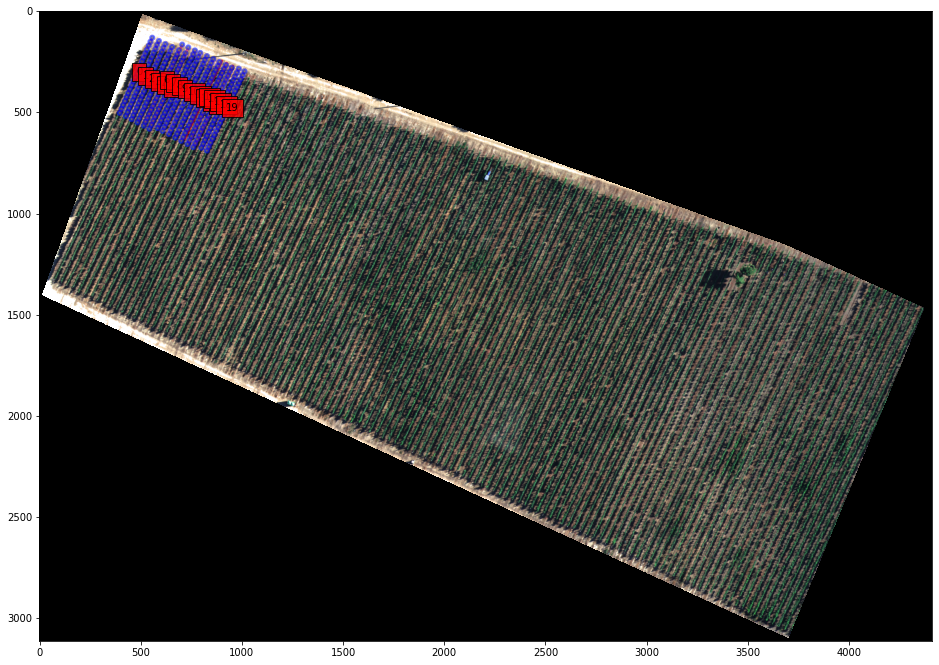

In [57]:
plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()

for i,Poly in enumerate(List_lines_origin_complete[:20,:,:]):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

for x1, y1 in centers_filter[:1000,:]: 
    circle = patches.Circle((x1, y1), r_circle, 
                            linewidth=2,
                             edgecolor='blue',
                             alpha=0.5,
                             fill = True) 
    ax.add_patch(circle)

In [49]:
centers_filter.shape

(7499, 2)

In [50]:
centers.shape

(12740, 2)

128.5106499195099


134.06828236579895


72952087

array([396., 503.])

array([396., 503.])